In [ ]:
import pandas as pd
import numpy as np

In [4]:
import os
import pandas as pd
from pathlib import Path
import multiprocessing as mp
from functools import partial
from tqdm import tqdm
import requests
import mimetypes

# infer extension from Content-Type and normalize common cases
def _ext_from_content_type(ct: str) -> str:
    if not ct:
        return ""
    # e.g., image/jpeg -> .jpg (mimetypes may return .jpe/.jpeg; prefer .jpg)
    ext = mimetypes.guess_extension(ct.split(";")[0].strip()) or ""
    if ext in (".jpe", ".jpeg"):
        return ".jpg"
    return ext

def download_and_name(url: str, save_dir: str) -> str:
    if not isinstance(url, str) or not url.strip():
        return "NAN"
    try:
        # HEAD first to get the content type without downloading body
        head = requests.head(url, timeout=15, allow_redirects=True)
        # Fallback to GET if server doesn’t support HEAD
        if head.status_code >= 400 or "content-type" not in head.headers:
            head = requests.get(url, stream=True, timeout=30)
            head.raise_for_status()
        content_type = head.headers.get("content-type", "")
        ext = _ext_from_content_type(content_type)

        # If extension still unknown, try to infer from URL path
        if not ext:
            path_name = Path(requests.utils.urlparse(url).path).name
            guessed = mimetypes.guess_type(path_name)[0]
            if guessed:
                ext = _ext_from_content_type(guessed)

        # Build filename: use last path segment (without ext) plus resolved ext
        base = Path(requests.utils.urlparse(url).path).name or "file"
        stem = Path(base).stem if Path(base).suffix else base
        filename = f"{stem}{ext or ''}"
        save_path = os.path.join(save_dir, filename)

        # If not present, download body to file
        if not os.path.exists(save_path):
            with requests.get(url, stream=True, timeout=60) as r:
                r.raise_for_status()
                with open(save_path, "wb") as f:
                    for chunk in r.iter_content(chunk_size=8192):
                        if chunk:
                            f.write(chunk)
        return filename
    except Exception:
        return "NAN"

def download_images_and_save_csv(
    input_csv="../dataset/train.csv",
    output_dir="images_test1",
    output_csv="dataset/train_with_image_name.csv",
    url_column="image_link",
    new_column="downloaded_image_name",
):
    os.makedirs(output_dir, exist_ok=True)
    df = pd.read_csv(input_csv)
    if url_column not in df.columns:
        raise ValueError(f"Column '{url_column}' not found in {input_csv}")
    urls = df[url_column].fillna("").astype(str).tolist()

    worker = partial(download_and_name, save_dir=output_dir)
    pool_size = max(4, min(32, (os.cpu_count() or 4) * 4))
    results = []
    with mp.Pool(pool_size) as pool:
        for name in tqdm(pool.imap_unordered(worker, urls), total=len(urls)):
            results.append(name)

    # Attach new column preserving other columns and write new CSV
    df[new_column] = results
    df.to_csv(output_csv, index=False)

def main():
    download_images_and_save_csv(
        input_csv="../dataset/train.csv",
        output_dir="all_images_train",
        output_csv="train_with_image_name_all_train.csv",
        url_column="image_link",
        new_column="downloaded_image_name",
    )

if __name__ == "__main__":
    mp.freeze_support()  
    main()

100%|██████████| 75000/75000 [06:04<00:00, 205.97it/s] 


In [3]:
import os
import pandas as pd
from pathlib import Path
import multiprocessing as mp
from functools import partial
from tqdm import tqdm
import requests
import mimetypes
import time
import logging

# --- Configure logging for cleaner output ---
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')


# Helper function to infer extension from Content-Type
def _ext_from_content_type(ct: str) -> str:
    """Infers a file extension from a MIME type, normalizing common cases."""
    if not ct:
        return ""
    # e.g., image/jpeg -> .jpg (mimetypes may return .jpe/.jpeg; prefer .jpg)
    ext = mimetypes.guess_extension(ct.split(";")[0].strip()) or ""
    if ext in (".jpe", ".jpeg"):
        return ".jpg"
    return ext


def download_and_name(url: str, save_dir: str, max_retries: int = 3, retry_delay: int = 2) -> str:
    """
    Downloads a file from a URL with retries, determines its extension,
    and saves it to a specified directory.

    Args:
        url (str): The URL of the image to download.
        save_dir (str): The directory where the image will be saved.
        max_retries (int): The maximum number of download attempts.
        retry_delay (int): The number of seconds to wait between retries.

    Returns:
        str: The filename if successful, otherwise "NAN".
    """
    if not isinstance(url, str) or not url.strip():
        return "NAN"

    # --- Retry loop starts here ---
    for attempt in range(max_retries):
        try:
            # HEAD first to get the content type without downloading body
            head = requests.head(url, timeout=15, allow_redirects=True)
            head.raise_for_status() # Check for HTTP errors like 404
            
            # Fallback to GET if server doesn’t support HEAD or lacks content-type
            if "content-type" not in head.headers:
                head = requests.get(url, stream=True, timeout=30)
                head.raise_for_status()

            content_type = head.headers.get("content-type", "")
            ext = _ext_from_content_type(content_type)

            # If extension is still unknown, try to infer from URL path
            if not ext:
                path_name = Path(requests.utils.urlparse(url).path).name
                guessed = mimetypes.guess_type(path_name)[0]
                if guessed:
                    ext = _ext_from_content_type(guessed)

            # Build filename: use last path segment (without ext) plus resolved ext
            base = Path(requests.utils.urlparse(url).path).name or "file"
            stem = Path(base).stem if Path(base).suffix else base
            filename = f"{stem}{ext or ''}"
            save_path = os.path.join(save_dir, filename)

            # If not present, download the full image
            if not os.path.exists(save_path):
                with requests.get(url, stream=True, timeout=60) as r:
                    r.raise_for_status()
                    with open(save_path, "wb") as f:
                        for chunk in r.iter_content(chunk_size=8192):
                            if chunk:
                                f.write(chunk)
            
            return filename # --- Success: exit the loop and function ---

        except requests.exceptions.RequestException as e:
            # --- Failure: log the error and wait before retrying ---
            logging.warning(
                f"Attempt {attempt + 1}/{max_retries} failed for URL: {url}. Error: {e}. Retrying in {retry_delay}s..."
            )
            time.sleep(retry_delay)
            
    # --- If all retries fail ---
    logging.error(f"All {max_retries} attempts failed for URL: {url}")
    return "NAN"


def download_images_and_save_csv(
    input_csv="../dataset/train.csv",
    output_dir="images_test1",
    output_csv="dataset/train_with_image_name.csv",
    url_column="image_link",
    new_column="downloaded_image_name",
    max_retries=3,
    retry_delay=2,
):
    """
    Orchestrates the image downloading process and reports the results.
    """
    os.makedirs(output_dir, exist_ok=True)
    df = pd.read_csv(input_csv)
    if url_column not in df.columns:
        raise ValueError(f"Column '{url_column}' not found in {input_csv}")
    urls = df[url_column].fillna("").astype(str).tolist()

    # Create a worker with pre-filled arguments for the download function
    worker = partial(
        download_and_name,
        save_dir=output_dir,
        max_retries=max_retries,
        retry_delay=retry_delay,
    )
    
    # Use multiprocessing to download in parallel
    pool_size = max(4, min(32, (os.cpu_count() or 4) * 4))
    results = []
    print(f"Starting download of {len(urls)} images with {pool_size} workers...")
    with mp.Pool(pool_size) as pool:
        for name in tqdm(pool.imap_unordered(worker, urls), total=len(urls)):
            results.append(name)

    # Attach new column with filenames and write the new CSV
    df[new_column] = results
    df.to_csv(output_csv, index=False)
    
    # --- New Feature: Final Summary Report ---
    success_count = len([res for res in results if res != "NAN"])
    failed_count = len(results) - success_count

    print("\n" + "="*35)
    print("      DOWNLOAD SUMMARY      ")
    print("="*35)
    print(f"✅ Successfully downloaded: {success_count} images")
    print(f"❌ Failed to download:      {failed_count} images")
    print(f"📊 Total URLs processed:    {len(results)}")
    print(f"💾 Results CSV saved to:    {output_csv}")
    print(f"🖼️ Images saved in:       '{output_dir}/'")
    print("="*35)



def main():
    download_images_and_save_csv(
        input_csv="../dataset/test.csv",
        output_dir="all_images_test_final",
        output_csv="test_with_image_all_test_new_75k.csv",
        url_column="image_link",
        new_column="downloaded_image_name",
        max_retries=30,  # Max number of attempts per image
        retry_delay=2,  # Seconds to wait between failed attempts
    )


if __name__ == "__main__":
    # This is important for multiprocessing to work correctly on Windows
    mp.freeze_support()  
    main()

Starting download of 75000 images with 16 workers...


  0%|          | 0/75000 [00:00<?, ?it/s]2025-10-12 15:21:33,225 - WARNING - Attempt 1/30 failed for URL: https://m.media-amazon.com/images/I/519Plng8cpL.jpg. Error: HTTPSConnectionPool(host='m.media-amazon.com', port=443): Max retries exceeded with url: /images/I/519Plng8cpL.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7ade592fe7b0>: Failed to establish a new connection: [Errno 101] Network is unreachable')). Retrying in 2s...
2025-10-12 15:21:33,223 - WARNING - Attempt 1/30 failed for URL: https://m.media-amazon.com/images/I/81ONUU3OAfL.jpg. Error: HTTPSConnectionPool(host='m.media-amazon.com', port=443): Max retries exceeded with url: /images/I/81ONUU3OAfL.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x7ade7c4280e0>: Failed to establish a new connection: [Errno 101] Network is unreachable')). Retrying in 2s...
2025-10-12 15:21:33,236 - WARNING - Attempt 1/30 failed for URL: https://m.media-amazon.com/images/I/


      DOWNLOAD SUMMARY      
✅ Successfully downloaded: 74999 images
❌ Failed to download:      1 images
📊 Total URLs processed:    75000
💾 Results CSV saved to:    test_with_image_all_test_new_75k.csv
🖼️ Images saved in:       'all_images_test_final/'


In [11]:
df = pd.read_csv("train_with_image_name.csv")

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 5 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   sample_id              75000 non-null  int64  
 1   catalog_content        75000 non-null  object 
 2   image_link             75000 non-null  object 
 3   price                  75000 non-null  float64
 4   downloaded_image_name  75000 non-null  object 
dtypes: float64(1), int64(1), object(3)
memory usage: 2.9+ MB


In [ ]:
df['catalog_content'].value_counts()

In [6]:
df['catalog_content'][89]

'Item Name: Mariani, Mediterranean Apricots (Pack of 24)\nProduct Description: Delicately sweet in flavor, Mariani Mediterranean Apricots contain a bounty of nourishing benefits. Every serving of these tender treats is a good source of the antioxidants vitamin A and E as well as potassium-a mineral known to promote good bone health. Live well and enjoy.\nValue: 24.0\nUnit: Count\n'

In [7]:
df['catalog_content'][829]

'Item Name: Eden Agar Flakes, 1-Ounce Package (Pack of 3)\nBullet Point 1: Pack of three, each pack holds 1 ounce (total of 3 ounce)\nBullet Point 2: A natural, pure vegetable quality gelatin and a much healthier alternative to commercial animal, chemical gelatins\nBullet Point 3: Made of a variety of sea vegetables with strong thickening properties\nBullet Point 4: Made in Japan\nBullet Point 5: The flakes dissolve in hot liquids and thicken as it cools\nValue: 3.0\nUnit: Ounce\n'

In [8]:
df['catalog_content'][2333]

'Item Name: Del Monte Veggieful Veggie Bowl, Asian Style Soy Sesame with Quinoa & Brown Rice, 7.4 Ounce\nBullet Point 1: ON-THE-GO MEAL: The Del Monte Asian style soy-sesame veggie bowl is a ready-to-eat meal that is convenient, easy to carry, and nutritious.\nBullet Point 2: NUTRITIOUS MEAL: Each bowl features a full serving of yummy veggies (1/2 cup of vegetables per USDA) and is an excellent fiber source for a healthy body.\nBullet Point 3: NO PRESERVATIVES: With no artificial flavors or sweeteners, non-GMO, and non-BPA, this veggie bowl is perfect as a meal and ready to eat.\nBullet Point 4: NUTRITIOUS AND DELICIOUS: The Veggie Bowl is filled with wholesome and delicious ingredients like carrots, corn, peas, bell peppers, and quinoa with a soy-sesame sauce. These meatless ready to eat meals cook in minutes, and are full of energy to last you the day.\nBullet Point 5: PREMIUM QUALITY: Del Monte has earned a reputation with innovations and dedication to quality. We strive to cultivat

In [10]:
df.isnull().sum()

sample_id                0
catalog_content          0
image_link               0
price                    0
downloaded_image_name    0
dtype: int64

In [13]:
df = df.head(4000)

In [ ]:
# ml_price_predictor.py
import os
import re
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.layers import Input, Dense, Embedding, LSTM, concatenate
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.applications import EfficientNetV2B0
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization
from tensorflow.keras.callbacks import TensorBoard, Callback

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

# ---------------------------
# Configuration
# ---------------------------
IMAGE_FOLDER = 'output_folder'       # folder where images are stored
IMG_SIZE = 224
MAX_TOKENS = 10000
OUTPUT_SEQUENCE_LENGTH = 100
BATCH_SIZE = 32
EPOCHS = 20
RANDOM_STATE = 42

# ---------------------------
# Example: replace with your real df
# ---------------------------
# Expecting df to exist already in the environment. If not, you can create a dummy df for quick runs.
# Required columns: 'catalog_content', 'downloaded_image_name', 'price'
if 'df' not in globals():
    # Create small dummy example so script runs
    os.makedirs(IMAGE_FOLDER, exist_ok=True)
    for name in ['wdnj1.jpg', 'wdnj2.jpg', 'wdnj3.jpg']:
        Image.new('RGB', (300, 300), color=(150, 150, 150)).save(os.path.join(IMAGE_FOLDER, name))

    df = pd.DataFrame({
        'catalog_content': [
            'Item Name: Mariani, Mediterranean Apricots (Pack of 24)\nProduct Description: Delicately sweet in flavor, Mariani Mediterranean Apricots contain a bounty of nourishing benefits. \nValue: 24.0\nUnit: Count\n',
            'Item Name: Eden Agar Flakes, 1-Ounce Package (Pack of 3)\nBullet Point 1: Pack of three, each pack holds 1 ounce (total of 3 ounce)\nValue: 3.0\nUnit: Ounce\n',
            'Item Name: Del Monte Veggieful Veggie Bowl, Asian Style Soy Sesame with Quinoa & Brown Rice, 7.4 Ounce\nBullet Point 1: ON-THE-GO MEAL: The Del Monte Asian style soy-sesame veggie bowl is a ready-to-eat meal that is convenient.\nValue: 7.4\nUnit: oz\n'
        ],
        'downloaded_image_name': ['wdnj1.jpg', 'wdnj2.jpg', 'wdnj3.jpg'],
        'price': [35.50, 14.20, 3.99]
    })

# ---------------------------
# 1) Parsing & Text Cleaning
# ---------------------------
def parse_catalog_content(text):
    """Return cleaned text, numeric value (float, 0 if missing), and unit (standardized)."""
    if not isinstance(text, str):
        text = ''

    value_match = re.search(r'Value:\s*([\d.]+)', text, flags=re.IGNORECASE)
    try:
        value = float(value_match.group(1)) if value_match else 0.0
    except Exception:
        value = 0.0

    unit_match = re.search(r'Unit:\s*([A-Za-z]+)', text, flags=re.IGNORECASE)
    unit = unit_match.group(1).strip().lower() if unit_match else 'unknown'
    # normalize some common variants
    if unit in ['oz', 'o', 'ounce', 'ounces']:
        unit = 'ounce'
    elif unit in ['count', 'ct']:
        unit = 'count'
    elif unit in ['g', 'gram', 'grams']:
        unit = 'gram'

    # Remove structured labels and numbers, keep natural language parts
    cleaned = re.sub(r'(Item Name|Product Description|Bullet Point \d+|Bullet Point|\bValue\b|Unit:)', '', text, flags=re.IGNORECASE)
    cleaned = cleaned.replace('\n', ' ')
    # optionally remove numbers (we keep numeric tokens like '24' are removed — value is in value_feature)
    cleaned = re.sub(r'\d+(\.\d+)?', ' ', cleaned)
    cleaned = re.sub(r'\s+', ' ', cleaned).strip()
    return cleaned, value, unit

parsed = df['catalog_content'].apply(lambda t: pd.Series(parse_catalog_content(t)))
parsed.columns = ['cleaned_text', 'value_feature', 'unit_feature']
df = pd.concat([df.reset_index(drop=True), parsed], axis=1)

# ---------------------------
# 2) Images -> arrays (robust)
# ---------------------------
os.makedirs(IMAGE_FOLDER, exist_ok=True)

def load_image_to_array(fname, size=IMG_SIZE, placeholder_color=(128,128,128)):
    p = os.path.join(IMAGE_FOLDER, fname)
    try:
        img = Image.open(p).convert('RGB').resize((size, size))
    except Exception:
        # missing or corrupted image: use placeholder
        img = Image.new('RGB', (size, size), color=placeholder_color)
    arr = np.array(img).astype('float32') / 255.0
    return arr

df['full_path'] = df['downloaded_image_name'].apply(lambda n: os.path.join(IMAGE_FOLDER, n) )
df['image_array'] = df['downloaded_image_name'].apply(lambda n: load_image_to_array(n, IMG_SIZE))

# ---------------------------
# 3) Text Vectorization
# ---------------------------
vectorizer = TextVectorization(max_tokens=MAX_TOKENS, output_sequence_length=OUTPUT_SEQUENCE_LENGTH, output_mode='int')
# adapt expects a Dataset or numpy array of strings
vectorizer.adapt(df['cleaned_text'].astype(str).values)

# convert to numpy array of ints
X_text_all = vectorizer(df['cleaned_text'].astype(str).values).numpy()   # shape: (N, OUTPUT_SEQUENCE_LENGTH)
vocab_size = int(vectorizer.vocabulary_size())

# ---------------------------
# 4) Structured features
# ---------------------------
# value_feature is numeric; unit_feature categorical
structured_preprocessor = ColumnTransformer(transformers=[
    ('num', StandardScaler(), ['value_feature']),
    ('cat', OneHotEncoder(handle_unknown='ignore', sparse=False), ['unit_feature'])
])

X_struct_all = structured_preprocessor.fit_transform(df[['value_feature', 'unit_feature']])

# ---------------------------
# 5) Images and targets
# ---------------------------
X_image_all = np.stack(df['image_array'].values, axis=0)  # (N, IMG_SIZE, IMG_SIZE, 3)
y_all = df['price'].values.reshape(-1, 1).astype('float32')

# scale the target for better regression behaviour
y_scaler = StandardScaler()
y_scaled_all = y_scaler.fit_transform(y_all)

# ---------------------------
# 6) Train/Test split
# ---------------------------
X_train_img, X_test_img, \
X_train_text, X_test_text, \
X_train_struct, X_test_struct, \
y_train, y_test = train_test_split(
    X_image_all, X_text_all, X_struct_all, y_scaled_all,
    test_size=0.25, random_state=RANDOM_STATE
)

print(f"Train samples: {X_train_img.shape[0]}, Test samples: {X_test_img.shape[0]}")

# ---------------------------
# 7) Build the 3-input model
# ---------------------------
# Image branch
image_input = Input(shape=(IMG_SIZE, IMG_SIZE, 3), name='image_input')
base_cnn = EfficientNetV2B0(weights='imagenet', include_top=False, input_tensor=image_input)
base_cnn.trainable = False
cnn_out = GlobalAveragePooling2D()(base_cnn.output)

# Text branch
text_input = Input(shape=(OUTPUT_SEQUENCE_LENGTH,), dtype='int32', name='text_input')
embed = Embedding(input_dim=vocab_size + 1, output_dim=64, mask_zero=True)(text_input)
lstm_out = LSTM(32)(embed)

# Structured branch
structured_input = Input(shape=(X_train_struct.shape[1],), name='structured_input')
structured_dense = Dense(32, activation='relu')(structured_input)

# Combine
combined = concatenate([cnn_out, lstm_out, structured_dense])
x = Dense(128, activation='relu')(combined)
x = Dense(64, activation='relu')(x)
output = Dense(1, name='price_output')(x)

model = Model(inputs=[image_input, text_input, structured_input], outputs=output)

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss='mean_absolute_error',
              metrics=[tf.keras.metrics.MeanSquaredError(name='mse')])

model.summary()

# ---------------------------
# 8) Callback to compute gradient norms per epoch
# ---------------------------
class GradientLoggingCallback(Callback):
    def __init__(self, sample_batch, verbose=1):
        super().__init__()
        self.sample_batch = sample_batch
        self.grad_norms = []
        self.verbose = verbose

    def on_epoch_end(self, epoch, logs=None):
        # compute gradients of loss w.r.t trainable weights on the sample batch
        x_img, x_text, x_struct, y_true = self.sample_batch
        with tf.GradientTape() as tape:
            preds = self.model([x_img, x_text, x_struct], training=False)
            loss = tf.keras.losses.mean_absolute_error(y_true, preds)
            loss = tf.reduce_mean(loss)
        grads = tape.gradient(loss, self.model.trainable_weights)
        # compute L2 norm of gradients (nan-safe)
        sq_sum = 0.0
        norms = []
        for g in grads:
            if g is None:
                norms.append(0.0)
            else:
                norm = tf.norm(g).numpy()
                norms.append(float(norm))
                sq_sum += (norm ** 2)
        total_norm = float(np.sqrt(sq_sum))
        self.grad_norms.append(total_norm)
        if self.verbose:
            print(f"Epoch {epoch+1}: sample batch loss={loss.numpy():.6f}, grad_norm={total_norm:.6f}")

# Create a small sample batch from training set to compute gradients each epoch
sample_idx = np.arange(min( max(1, BATCH_SIZE // 4), X_train_img.shape[0] ))
sample_batch = (X_train_img[sample_idx], X_train_text[sample_idx], X_train_struct[sample_idx], y_train[sample_idx])
grad_logger = GradientLoggingCallback(sample_batch=sample_batch, verbose=1)

# TensorBoard optional
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_cb = TensorBoard(log_dir=log_dir)

# ---------------------------
# 9) Fit the model
# ---------------------------
history = model.fit(
    [X_train_img, X_train_text, X_train_struct],
    y_train,
    validation_data=([X_test_img, X_test_text, X_test_struct], y_test),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[grad_logger, tensorboard_cb],
    verbose=1
)

# ---------------------------
# 10) Evaluate and additional metrics
# ---------------------------
eval_results = model.evaluate([X_test_img, X_test_text, X_test_struct], y_test, verbose=1)
test_mae = eval_results[0]
test_mse = eval_results[1]
print(f"\nTest MAE (scaled target): {test_mae:.6f}, Test MSE (scaled): {test_mse:.6f}")

# convert predictions back to original price scale
y_pred_scaled = model.predict([X_test_img, X_test_text, X_test_struct])
y_pred = y_scaler.inverse_transform(y_pred_scaled.reshape(-1,1)).reshape(-1)
y_true = y_scaler.inverse_transform(y_test.reshape(-1,1)).reshape(-1)

# Additional metrics (in original price units)
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
mae_orig = mean_absolute_error(y_true, y_pred)
mse_orig = mean_squared_error(y_true, y_pred)
rmse_orig = np.sqrt(mse_orig)
r2 = r2_score(y_true, y_pred)
print(f"Test MAE (orig): {mae_orig:.4f}, RMSE (orig): {rmse_orig:.4f}, R^2: {r2:.4f}")

# ---------------------------
# 11) MRR (ranking-style adapted for regression)
# For each test sample s:
#  - compute absolute error of every model prediction (pred_j) vs true price y_true_s
#  - find the rank of the model's own prediction (i.e., model's prediction at index s) when sorting those errors ascending
#  - reciprocal rank = 1/rank
#  - MRR is mean of reciprocal ranks across test set
# This measures whether the model's own prediction is among the top-ranked predictions with smallest distance to the sample's true price.
# ---------------------------
def compute_mrr(y_true_vals, predictions):
    """
    y_true_vals: array of true prices (N,)
    predictions: array of predicted prices (N,)
    returns: MRR scalar
    """
    N = len(y_true_vals)
    rr_list = []
    for i in range(N):
        true_val = y_true_vals[i]
        # absolute errors of all predictions to this true value
        abs_errors = np.abs(predictions - true_val)
        # rank positions when sorted ascending (1-based)
        # the rank of the model's own prediction is:
        # 1 + number of predictions strictly closer than model's
        my_error = abs_errors[i]
        rank = 1 + int(np.sum(abs_errors < my_error))
        rr = 1.0 / rank
        rr_list.append(rr)
    return float(np.mean(rr_list))

mrr = compute_mrr(y_true, y_pred)
print(f"MRR (ranking-style): {mrr:.6f}")

# ---------------------------
# 12) Save small predictions table
# ---------------------------
pred_df = pd.DataFrame({
    'true_price': y_true,
    'predicted_price': y_pred,
    'abs_error': np.abs(y_true - y_pred)
})
pred_df_sorted = pred_df.sort_values('abs_error')
print("\nTop 5 predictions (by lowest absolute error):")
print(pred_df_sorted.head())

# ---------------------------
# 13) Plot losses and gradient norms
# ---------------------------
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.plot(history.history['loss'], label='train_mae')
plt.plot(history.history['val_loss'], label='val_mae')
plt.xlabel('epoch'); plt.ylabel('MAE (scaled target)'); plt.legend(); plt.title('MAE')

plt.subplot(1,3,2)
plt.plot(history.history['mse'], label='train_mse')
plt.plot(history.history['val_mse'], label='val_mse')
plt.xlabel('epoch'); plt.ylabel('MSE'); plt.legend(); plt.title('MSE')

plt.subplot(1,3,3)
plt.plot(grad_logger.grad_norms, label='grad_norm')
plt.xlabel('epoch'); plt.ylabel('grad L2 norm'); plt.legend(); plt.title('Gradient Norms')

plt.tight_layout()
plt.show()

# ---------------------------
# 14) Single-sample prediction example
# ---------------------------
if X_test_img.shape[0] > 0:
    idx0 = 0
    sample_img = np.expand_dims(X_test_img[idx0], axis=0)
    sample_text = np.expand_dims(X_test_text[idx0], axis=0)
    sample_struct = np.expand_dims(X_test_struct[idx0], axis=0)
    pred_scaled = model.predict([sample_img, sample_text, sample_struct])
    pred_price = float(y_scaler.inverse_transform(pred_scaled.reshape(-1,1))[0][0])
    actual_price = float(y_scaler.inverse_transform(y_test[idx0].reshape(-1,1))[0][0])
    print(f"\nSample prediction -> Predicted: ${pred_price:.2f}, Actual: ${actual_price:.2f}")

# Optionally save model
# model.save('price_predictor_model.h5')


Using device: cpu


✅ Data preprocessed successfully. Example:
                                         description  price  \
0  La Victoria Green Taco Sauce Mild, 12 Ounce (P...  72.00   
1  Salerno Cookies, The Original Butter Cookies, ...  32.00   
2  Bear Creek Hearty Soup Bowl, Creamy Chicken wi...  11.40   
3  Judee’s Blue Cheese Powder 11.25 oz - Gluten-F...  11.25   
4  kedem Sherry Cooking Wine, 12.7 Ounce - 12 per...  12.00   

                     image_path  
0  output_image/51mo8htwTHL.jpg  
1  output_image/41mu0HAToDL.jpg  
2  output_image/71YtriIHAAL.jpg  
3  output_image/51+PFEe-w-L.jpg  
4  output_image/21O9RftI2vL.jpg  

Data split into 3152 training samples and 789 testing samples.


Epoch 1/5 [Validation]: 100%|██████████| 50/50 [01:25<00:00,  1.72s/it]


Epoch 1/5 -> Train Loss: 713875.9531 | Val Loss: 11483.2171 | Val MRR: 0.0123


Epoch 2/5 [Validation]: 100%|██████████| 50/50 [01:32<00:00,  1.86s/it]


Epoch 2/5 -> Train Loss: 713856.0694 | Val Loss: 11467.1805 | Val MRR: 0.0135


Epoch 3/5 [Validation]: 100%|██████████| 50/50 [01:31<00:00,  1.82s/it]


Epoch 3/5 -> Train Loss: 713840.8176 | Val Loss: 11456.4217 | Val MRR: 0.0142


Epoch 4/5 [Validation]: 100%|██████████| 50/50 [01:32<00:00,  1.86s/it]


Epoch 4/5 -> Train Loss: 713828.4632 | Val Loss: 11446.5201 | Val MRR: 0.0142


Epoch 5/5 [Validation]: 100%|██████████| 50/50 [03:20<00:00,  4.00s/it]


Epoch 5/5 -> Train Loss: 713815.3967 | Val Loss: 11436.8492 | Val MRR: 0.0146

✅ Training finished. Plotting results...


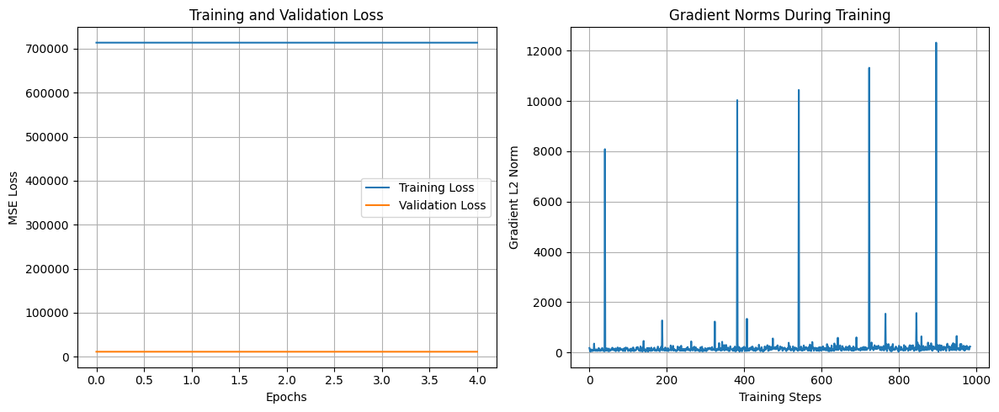

In [14]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
from PIL import Image
import pandas as pd
import numpy as np
import open_clip
import re
import os
from tqdm import tqdm
import matplotlib.pyplot as plt

# --- 1. Setup and Configuration ---
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
MODEL_NAME = 'ViT-B-32'
PRETRAINED_CHECKPOINT = 'laion2b_s34b_b79k'
BATCH_SIZE = 16
LEARNING_RATE = 1e-5
EPOCHS = 5

print(f"Using device: {DEVICE}")

# --- 2. Data Preparation and Preprocessing ---

# Create a dummy dataframe for demonstration.
# In your real use case, you would load your CSV here, e.g., df = pd.read_csv('your_data.csv')
data = {
    'catalog_content': [
        'Item Name: Mariani, Mediterranean Apricots (Pack of 24)\nProduct Description: Delicately sweet in flavor, Mariani Mediterranean Apricots contain a bounty of nourishing benefits. Every serving of these tender treats is a good source of the antioxidants vitamin A and E as well as potassium-a mineral known to promote good bone health. Live well and enjoy.\nValue: 24.0\nUnit: Count\n',
        'Item Name: Eden Agar Flakes, 1-Ounce Package (Pack of 3)\nBullet Point 1: Pack of three, each pack holds 1 ounce (total of 3 ounce)\nBullet Point 2: A natural, pure vegetable quality gelatin and a much healthier alternative to commercial animal, chemical gelatins\nBullet Point 3: Made of a variety of sea vegetables with strong thickening properties\nValue: 15.50\nUnit: Ounce\n',
        'Item Name: Del Monte Veggieful Veggie Bowl, Asian Style Soy Sesame with Quinoa & Brown Rice, 7.4 Ounce\nBullet Point 1: ON-THE-GO MEAL: The Del Monte Asian style soy-sesame veggie bowl is a ready-to-eat meal that is convenient, easy to carry, and nutritious.\nBullet Point 2: NUTRITIOUS MEAL: Each bowl features a full serving of yummy veggies (1/2 cup of vegetables per USDA) and is an excellent fiber source for a healthy body.\nValue: 7.4\nUnit: oz\n',
        'Item Name: Organic Whole Cashews\nProduct Description: Large, delicious, and perfect for snacking or baking. Sourced from organic farms.\nValue: 12.99\nUnit: Pound\n',
        'Item Name: Sparkling Water, 12 Pack\nProduct Description: Crisp and refreshing, zero-calorie sparkling water with natural lime flavor.\nValue: 5.99\nUnit: Pack\n',
    ] * 20, # Multiply data to have enough for splitting
    'downloaded_image_name': [f'image_{i}.jpg' for i in range(100)]
}
# df = pd.DataFrame(data)

# Create a dummy image directory and dummy images
# In your real code, this directory should contain your actual downloaded images.
IMAGE_DIR = 'output_image'
os.makedirs(IMAGE_DIR, exist_ok=True)
for img_name in df['downloaded_image_name']:
    dummy_image = Image.new('RGB', (224, 224), color = (np.random.randint(0,255), np.random.randint(0,255), np.random.randint(0,255)))
    dummy_image.save(os.path.join(IMAGE_DIR, img_name))

def preprocess_text_and_extract_price(df: pd.DataFrame) -> pd.DataFrame:
    """
    Parses the 'catalog_content' column to extract the price and create a clean
    description string.
    """
    processed_data = []
    for _, row in df.iterrows():
        content = row['catalog_content']
        
        # Extract price (Value) using regex
        price_match = re.search(r'Value:\s*(\d+\.?\d*)', content)
        price = float(price_match.group(1)) if price_match else np.nan
        
        # Clean up the text for CLIP
        # Remove the value and unit lines, replace newlines/bullets with spaces
        text = re.sub(r'Value:.*', '', content)
        text = re.sub(r'Unit:.*', '', text)
        text = re.sub(r'Bullet Point \d+:', '', text)
        text = text.replace('\n', ' ').replace('Item Name:', '').strip()
        text = re.sub(r'\s+', ' ', text) # Replace multiple spaces with a single one
        
        if not np.isnan(price):
            processed_data.append({
                'description': text,
                'price': price,
                'image_path': os.path.join(IMAGE_DIR, row['downloaded_image_name'])
            })
            
    return pd.DataFrame(processed_data)

# Process the data
df_processed = preprocess_text_and_extract_price(df)
print("✅ Data preprocessed successfully. Example:")
print(df_processed.head())

# Split the data
train_df, test_df = train_test_split(df_processed, test_size=0.2, random_state=42)
print(f"\nData split into {len(train_df)} training samples and {len(test_df)} testing samples.")

# --- 3. Custom PyTorch Dataset ---
class ProductPriceDataset(Dataset):
    def __init__(self, df, image_transform, tokenizer):
        self.df = df
        self.image_transform = image_transform
        self.tokenizer = tokenizer

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        
        # Image processing
        image = self.image_transform(Image.open(row['image_path']).convert('RGB'))
        
        # Text processing
        text = self.tokenizer(row['description'])[0]
        
        # Price (target)
        price = torch.tensor(row['price'], dtype=torch.float32)
        
        return {
            'image': image,
            'text': text,
            'price': price
        }

# --- 4. Model Definition: CLIP + Regression Head ---
class CLIPPricePredictor(nn.Module):
    def __init__(self, clip_model):
        super().__init__()
        self.clip = clip_model
        
        # Determine the size of the combined embeddings
        embedding_dim = self.clip.text_projection.shape[1] * 2 # Image and Text embeddings combined
        
        # Regression head to predict a single value (price)
        self.regression_head = nn.Sequential(
            nn.Linear(embedding_dim, embedding_dim // 2),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(embedding_dim // 2, 1)
        )

    def forward(self, image, text):
        with torch.no_grad(): # Keep CLIP frozen initially, or make it trainable
            image_features = self.clip.encode_image(image)
            text_features = self.clip.encode_text(text)
        
        # Normalize features (good practice)
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
        
        # Combine features and predict price
        combined_features = torch.cat([image_features, text_features], dim=1)
        predicted_price = self.regression_head(combined_features)
        
        return predicted_price.squeeze(-1)

# --- 5. Training and Evaluation Loop ---
def calculate_mrr(preds, targets):
    """
    Calculates Mean Reciprocal Rank (MRR) for a regression task.
    This is an adaptation: for each prediction, we rank its correctness
    against all targets in the batch.
    """
    if len(preds) == 0:
        return 0.0
    
    reciprocal_ranks = []
    for i in range(len(preds)):
        pred = preds[i]
        target = targets[i]
        
        # Calculate the error of the current prediction to ALL targets in the batch
        errors = torch.abs(pred - targets)
        
        # Find the rank of the error corresponding to the TRUE target
        # We sort the errors and find where our true error falls
        true_error = torch.abs(pred - target)
        
        # The rank is the number of errors smaller than our true error + 1
        rank = (errors < true_error).sum() + 1
        reciprocal_ranks.append(1.0 / rank.float())
        
    return torch.mean(torch.tensor(reciprocal_ranks)).item()

def train_and_evaluate(model, train_loader, val_loader, optimizer, loss_fn, epochs):
    history = {
        'train_loss': [],
        'val_loss': [],
        'val_mrr': [],
        'grad_norms': []
    }

    for epoch in range(epochs):
        model.train()
        total_train_loss = 0
        
        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Training]")
        for batch in progress_bar:
            images = batch['image'].to(DEVICE)
            texts = batch['text'].to(DEVICE)
            prices = batch['price'].to(DEVICE)

            # Forward pass
            predictions = model(images, texts)
            loss = loss_fn(predictions, prices)

            # Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            
            # --- Track Gradients ---
            total_norm = 0
            for p in model.parameters():
                if p.grad is not None:
                    param_norm = p.grad.data.norm(2)
                    total_norm += param_norm.item() ** 2
            total_norm = total_norm ** 0.5
            history['grad_norms'].append(total_norm)
            # ---------------------
            
            optimizer.step()
            total_train_loss += loss.item()
            progress_bar.set_postfix({'loss': loss.item(), 'grad_norm': total_norm})

        avg_train_loss = total_train_loss / len(train_loader)
        history['train_loss'].append(avg_train_loss)

        # --- Validation ---
        model.eval()
        total_val_loss = 0
        all_preds = []
        all_targets = []
        with torch.no_grad():
            for batch in tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} [Validation]"):
                images = batch['image'].to(DEVICE)
                texts = batch['text'].to(DEVICE)
                prices = batch['price'].to(DEVICE)
                
                predictions = model(images, texts)
                loss = loss_fn(predictions, prices)
                total_val_loss += loss.item()
                
                all_preds.append(predictions)
                all_targets.append(prices)

        avg_val_loss = total_val_loss / len(val_loader)
        val_mrr = calculate_mrr(torch.cat(all_preds), torch.cat(all_targets))
        history['val_loss'].append(avg_val_loss)
        history['val_mrr'].append(val_mrr)

        print(f"Epoch {epoch+1}/{epochs} -> Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f} | Val MRR: {val_mrr:.4f}")

    return history

# --- 6. Main Execution ---
if __name__ == '__main__':
    # Load CLIP model and processors
    clip_model, _, preprocess = open_clip.create_model_and_transforms(
        MODEL_NAME, 
        pretrained=PRETRAINED_CHECKPOINT,
        device=DEVICE
    )
    tokenizer = open_clip.get_tokenizer(MODEL_NAME)
    
    # Create Datasets and DataLoaders
    train_dataset = ProductPriceDataset(train_df, preprocess, tokenizer)
    test_dataset = ProductPriceDataset(test_df, preprocess, tokenizer)
    
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)
    
    # Initialize our custom model
    model = CLIPPricePredictor(clip_model).to(DEVICE)
    
    # Make CLIP parameters trainable (fine-tuning)
    # For a larger dataset, you might only train the regression head first,
    # then unfreeze some CLIP layers. For this example, we train all.
    for param in model.parameters():
        param.requires_grad = True

    # Define optimizer and loss function (MSE is standard for regression)
    optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE)
    loss_fn = nn.MSELoss()

    # Run training
    training_history = train_and_evaluate(model, train_loader, test_loader, optimizer, loss_fn, EPOCHS)

    # --- 7. Plotting Results ---
    print("\n✅ Training finished. Plotting results...")
    
    # Plot Losses
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(training_history['train_loss'], label='Training Loss')
    plt.plot(training_history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('MSE Loss')
    plt.legend()
    plt.grid(True)

    # Plot Grads
    plt.subplot(1, 2, 2)
    plt.plot(training_history['grad_norms'])
    plt.title('Gradient Norms During Training')
    plt.xlabel('Training Steps')
    plt.ylabel('Gradient L2 Norm')
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

In [ ]:
pip